In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

In [3]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"billiemage","key":"fe24b02ed4ea8c6686c843b9804eb796"}'}

In [4]:
! mkdir ~/.kaggle

! cp kaggle.json ~/.kaggle/

In [5]:
! chmod 600 ~/.kaggle/kaggle.json

In [6]:
!kaggle datasets download -d veeralakrishna/200-bird-species-with-11788-images

100% 1.10G/1.11G [00:05<00:00, 198MB/s]
100% 1.11G/1.11G [00:05<00:00, 209MB/s]


In [7]:
!unzip /content/200-bird-species-with-11788-images.zip

Archive:  /content/200-bird-species-with-11788-images.zip
  inflating: CUB_200_2011.tgz        
  inflating: segmentations.tgz       


In [8]:
!tar -xvzf /content/CUB_200_2011.tgz

Streaming output truncated to the last 5000 lines.
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0050_111087.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0079_113288.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0004_111989.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0068_113247.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0127_111935.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0094_112773.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0028_113217.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0126_110959.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0007_111029.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0096_111519.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0120_113001.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0010_112678.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0025_111669.jpg
CUB_200_2011/images/118.House_Sparrow/House_Sparrow_0084_111300.j

In [ ]:
!sudo apt-get install imagemagick

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  fonts-droid-fallback fonts-noto-mono ghostscript gsfonts
  imagemagick-6-common imagemagick-6.q16 libcupsfilters1 libcupsimage2
  libdjvulibre-text libdjvulibre21 libgs9 libgs9-common libijs-0.35
  libjbig2dec0 liblqr-1-0 libmagickcore-6.q16-3 libmagickcore-6.q16-3-extra
  libmagickwand-6.q16-3 libnetpbm10 libwmf0.2-7 netpbm poppler-data
Suggested packages:
  fonts-noto ghostscript-x imagemagick-doc autotrace cups-bsd | lpr | lprng
  enscript gimp gnuplot grads hp2xx html2ps libwmf-bin mplayer povray radiance
  sane-utils texlive-base-bin transfig ufraw-batch inkscape libjxr-tools
  libwmf0.2-7-gtk poppler-utils fonts-japanese-mincho | fonts-ipafont-mincho
  fonts-japanese-gothic | fonts-ipafont-gothic fonts-arphic-ukai
  fonts-arphic-uming fonts-nanum
The following NEW packages will be installed:
  fonts-droid-fallback fonts-noto-mono g

In [9]:
import os
os.mkdir("/content/val")

In [10]:
os.mkdir("/content/test")

In [11]:
# seperate validation from overall data 
# separate 10 images per class from data for val data

import shutil
import os

percent = 0.1

source = "/content/CUB_200_2011/images/"
destination = "/content/val/"

t_fol = os.listdir(source)
d_fol = os.listdir(destination)

for fol in t_fol:
    file_folder = source + fol
    files = os.listdir(file_folder)
    num_of_images_per_class = int(len(files)*percent)
    os.mkdir(destination+fol)
    for i,f in enumerate(files):
        if i >(num_of_images_per_class-1): continue
        shutil.move(file_folder+"/"+f ,destination + fol)

In [12]:
import shutil
import os

num_of_images_per_class = 0.05
source = "/content/CUB_200_2011/images/"
destination = "/content/test/"

t_fol = os.listdir(source)
d_fol = os.listdir(destination)

for fol in t_fol:
    file_folder = source + fol
    files = os.listdir(file_folder)
    num_of_images_per_class = int(len(files)*percent)
    os.mkdir(destination+fol)
    for i,f in enumerate(files):
        if i >(num_of_images_per_class-1): continue
        shutil.move(file_folder+"/"+f ,destination + fol)

In [13]:
import numpy as np
import torch
import os
from PIL import Image
import random
import torchvision
from torch.utils.data import DataLoader,Dataset
from torch.utils.data.sampler import BatchSampler
import torchvision.transforms as transforms  
from tqdm import tqdm_notebook
from torch import optim
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt

In [14]:
train_data_dir = "/content/CUB_200_2011/images/"
val_data_dir = "/content/val/"
test_data_dir = "/content/test/"
outcomes = os.listdir(train_data_dir)
print(outcomes)

['086.Pacific_Loon', '145.Elegant_Tern', '105.Whip_poor_Will', '037.Acadian_Flycatcher', '062.Herring_Gull', '087.Mallard', '093.Clark_Nutcracker', '035.Purple_Finch', '164.Cerulean_Warbler', '191.Red_headed_Woodpecker', '127.Savannah_Sparrow', '195.Carolina_Wren', '189.Red_bellied_Woodpecker', '007.Parakeet_Auklet', '109.American_Redstart', '154.Red_eyed_Vireo', '080.Green_Kingfisher', '131.Vesper_Sparrow', '194.Cactus_Wren', '090.Red_breasted_Merganser', '034.Gray_crowned_Rosy_Finch', '014.Indigo_Bunting', '047.American_Goldfinch', '042.Vermilion_Flycatcher', '049.Boat_tailed_Grackle', '038.Great_Crested_Flycatcher', '001.Black_footed_Albatross', '133.White_throated_Sparrow', '136.Barn_Swallow', '040.Olive_sided_Flycatcher', '061.Heermann_Gull', '117.Clay_colored_Sparrow', '123.Henslow_Sparrow', '135.Bank_Swallow', '036.Northern_Flicker', '101.White_Pelican', '072.Pomarine_Jaeger', '021.Eastern_Towhee', '083.White_breasted_Kingfisher', '053.Western_Grebe', '022.Chuck_will_Widow', '06

In [15]:
# import cv2
# path = "/content/Stanford_Online_Products/cabinet_final/110715681235_0.jpg"
# img = cv2.imread(path)
# img.shape

In [16]:
transform = torchvision.transforms.Compose([transforms.Resize((256,256)),
                                            transforms.RandomCrop(256),
                                            transforms.RandomHorizontalFlip(p=0.5),            
                                            transforms.ToTensor()])

test_transform = torchvision.transforms.Compose([transforms.Resize((256,256)),
                                                 transforms.CenterCrop(256),
                                                 transforms.ToTensor()])


test_transform_2 = torchvision.transforms.Compose([transforms.Resize((256,256)),
                                                 transforms.ToTensor()])

In [17]:
train_data = torchvision.datasets.ImageFolder(root=train_data_dir,transform=transform)
val_data = torchvision.datasets.ImageFolder(root=val_data_dir,transform=test_transform)
test_data = torchvision.datasets.ImageFolder(root=test_data_dir, transform=test_transform_2)

In [18]:
class ImageBatchSampler(BatchSampler):
    """
    Returns batches of size n_classes * n_samples
    """
    
    def __init__(self, dataset,n_classes, n_samples,batch_size):
        loader = DataLoader(dataset)
        self.labels_list = []
        for _, label in loader:
            self.labels_list.append(label)
        self.labels = torch.LongTensor(self.labels_list)
        self.labels_set = list(set(self.labels.numpy()))
        self.label_to_indices = {label: np.where(self.labels.numpy() == label)[0]
                                 for label in self.labels_set}
        for l in self.labels_set:
            np.random.shuffle(self.label_to_indices[l])
        self.used_label_indices_count = {label: 0 for label in self.labels_set}
        self.count = 0
        self.n_classes = n_classes
        self.n_samples = n_samples
        self.dataset = dataset
        self.batch_size = batch_size

    def __iter__(self):
        self.count = 0
        while self.count + self.batch_size < len(self.dataset):
            classes = np.random.choice(self.labels_set, self.n_classes, replace=False)
            indices = []
            num = 0
            for class_ in classes:
                num += 1
                indices.extend(self.label_to_indices[class_][
                               self.used_label_indices_count[class_]:self.used_label_indices_count[
                                                                         class_] + self.n_samples])
                self.used_label_indices_count[class_] += self.n_samples
                if self.used_label_indices_count[class_] + self.n_samples > len(self.label_to_indices[class_]):
                    np.random.shuffle(self.label_to_indices[class_])
                    self.used_label_indices_count[class_] = 0
                if num == 3:
                    yield indices
                    indices = []
                    num = 0    
            self.count += self.n_classes * self.n_samples

    def __len__(self):
        return len(self.dataset) // self.batch_size

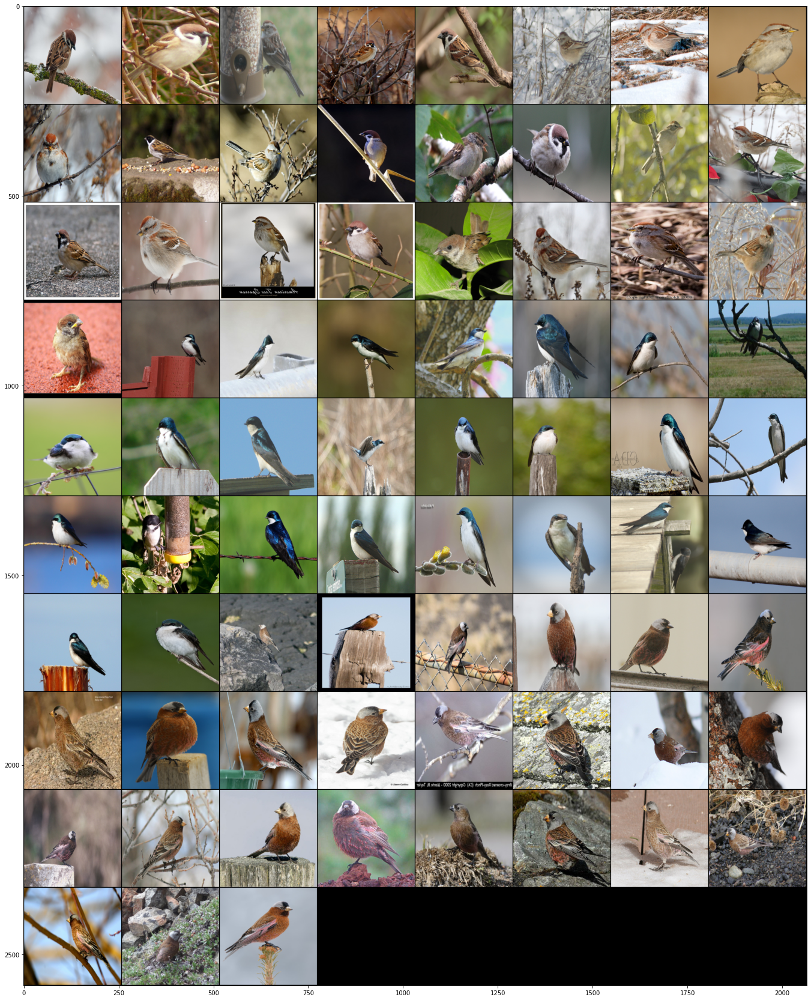

In [19]:
n_classes = 200
n_samples = 25
train_sampler = ImageBatchSampler(train_data, n_classes, n_samples,75)
val_sampler = ImageBatchSampler(val_data, n_classes, n_samples,75)

train_loader = DataLoader(train_data, batch_sampler=train_sampler)
val_loader = DataLoader(val_data, batch_sampler=val_sampler)

my_testiter = iter(train_loader)
images, target = my_testiter.next()

plt.figure(figsize=[30,30])
def imshow(img):
    npimg = img.numpy()
    npimg = np.moveaxis(npimg,0,-1)
    plt.imshow(npimg)

imshow(torchvision.utils.make_grid(images))

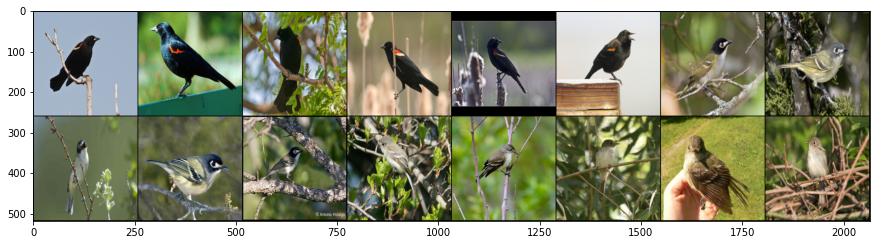

In [20]:
# plot validation data
my_testiter = iter(val_loader)
images, target = my_testiter.next()

plt.figure(figsize=[15,10])
def imshow(img):
    npimg = img.numpy()
    npimg = np.moveaxis(npimg,0,-1)
    plt.imshow(npimg)

imshow(torchvision.utils.make_grid(images))

In [21]:
class EmbeddedFeatureWrapper(nn.Module):
    """
    DNN head: pools, down-projects, and normalizes DNN features to be of unit length.
    """
    def __init__(self, input_dim, output_dim, dropout=0):
        super(EmbeddedFeatureWrapper, self).__init__()
        self.output_dim = output_dim
        self.dropout = dropout
        if output_dim != 2048:
            self.pool = nn.AdaptiveAvgPool2d(1)
        self.standardize = nn.LayerNorm(input_dim, elementwise_affine = False)
        self.remap = None
        if input_dim != output_dim:
           self.remap = nn.Linear(input_dim, output_dim, bias = False)
    
    def forward(self, x):
        if self.output_dim != 2048:
            x = self.pool(x)
        x = x.view(x.size(0), -1)
        x = self.standardize(x)
        if self.remap:
           x = self.remap(x)     
        x = nn.functional.normalize(x, dim=1)
        return x
    
    
class L2NormalizedLinearLayer(nn.Module):
    """
    Apply a linear layer to the input, where the weights are normalized to be of unit length.
    """
    def __init__(self, input_dim, output_dim):
        super(L2NormalizedLinearLayer, self).__init__()
        self.weight = nn.Parameter(torch.Tensor(output_dim, input_dim))    
        stdv = 1. / math.sqrt(self.weight.size(1))
        self.weight.data.uniform_(-stdv, stdv)
        # Initialization from nn.Linear (https://github.com/pytorch/pytorch/blob/v1.0.0/torch/nn/modules/linear.py#L129)
        
    def forward(self, x):
        norm_weight = nn.functional.normalize(self.weight, dim=1)
        prediction_logits = nn.functional.linear(x, norm_weight)
        return prediction_logits
        

class NormSoftmaxLoss(nn.Module):
    """
    Apply temperature scaling on logits before computing the cross-entropy loss.
    """
    def __init__(self, temperature=0.05):
        super(NormSoftmaxLoss, self).__init__() 
        self.temperature = temperature
        self.loss_fn = nn.CrossEntropyLoss()
 
    def forward(self, prediction_logits, instance_targets):
        loss = self.loss_fn(prediction_logits / self.temperature, instance_targets)
        return loss

In [22]:
device =  torch.device('cuda' if torch.cuda.is_available else 'cpu')

In [23]:
model = torchvision.models.resnet50(pretrained=True)

# for param in model.parameters():
#     param.required_grad = False

num_ftrt = model.fc.in_features

model.fc = nn.Linear(num_ftrt,12)
model

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [24]:
# By default uses the 2048 dimensional pooling layer as implemented in the paper.
# Optionally can instead keep the 4096-dimensional pooling layer from the ResNet-50 model.
import math
EMBEDDING_DIM =2048
input_dim = 2048
output_dim = 200
DROPOUT = 0.1

if EMBEDDING_DIM != 4096:
    modules = []
    pooling_dim = 2048
else:
    modules = [l for l in learn.model[1][:3]]
    pooling_dim = 4096
    
# Add new layers
modules.append(EmbeddedFeatureWrapper(input_dim=pooling_dim, 
                                      output_dim=EMBEDDING_DIM, 
                                      dropout=DROPOUT))
modules.append(L2NormalizedLinearLayer(input_dim=EMBEDDING_DIM, 
                                       output_dim=output_dim))

model.fc = nn.Sequential(*modules)

model.to(device)
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [25]:
!pip install torchmetrics

     |████████████████████████████████| 272 kB 7.2 MB/s 


In [26]:
import torchmetrics
# initialize metric
metric = torchmetrics.Accuracy().to(device)

criterion = NormSoftmaxLoss()
# specify optimizer
optimizer = torch.optim.SGD(model.parameters(), lr=0.001, momentum=0.9, weight_decay=1e-4)

#scheduler
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=15, gamma=0.1)

In [27]:
# number of epochs for training set
epochs = 20

# track change in validation loss
valid_loss_min = np.Inf
val_loss = []
tn_loss = []

for epoch in range(1,epochs+1):

    # keep track of training and validation loss
    train_loss = 0.0
    valid_loss = 0.0
    train_acc = 0.0
    valid_acc = 0.0
    # Train the model
    model.train()
    for (data, target) in tqdm_notebook(train_loader):       
        # move tensor to gpu if cuda is available
        data, target = data.to(device), target.to(device)
        # clear the gradiant of all optimizer variable
        optimizer.zero_grad()
        # forward pass: compute pradictions by passing inputs
        output = model(data)
        # calculate batch loss
        loss = criterion(output, target)
        # calculate accuracy
        acc = metric(output, target)
        # backward pass: compute gradiant of the loss with respect to the parameters
        loss.backward()
        # update parameters by optimizing single step
        optimizer.step()
        
        # update training loss
        train_loss += loss.item()*data.size(0)
        train_acc += acc.item()*data.size(0)

    # validate the model

    model.eval()
    for (data, target) in tqdm_notebook(val_loader):
        # move tensor to gpu
        data, target = data.to(device), target.to(device)
        # forward pass: compute the validation predictions
        output = model(data)
        # calculate the loss
        loss = criterion(output, target)
        # calculate the accuracy
        acc = metric(output, target)
        # update the validation loss 
        valid_loss += loss.item()*data.size(0)
        valid_acc += acc.item()*data.size(0)
    
    # calculate average loss
    train_loss = train_loss/len(train_loader.sampler)
    valid_loss = valid_loss/len(val_loader.sampler)
    train_acc = train_acc/len(train_loader.sampler)
    valid_acc = valid_acc/len(val_loader.sampler)

    val_loss.append(valid_loss)
    tn_loss.append(train_loss)
    # update learning rate
    scheduler.step()
    # Print the train and validation loss statistic
    print('Epoch: {} \t Training Loss: {:.3f} \t Validation Loss: {:.3f} \t train acc: {:.3f} \t valid acc: {:.3f}'.format(epoch, train_loss, valid_loss,train_acc,valid_acc))
    
    # save model if validation loss decrease
    if valid_loss <= valid_loss_min:
        print("Validation loss decreased {:.4f}--->{:.4f}  Saving model...".format(valid_loss_min, valid_loss))
        # save current model
        torch.save(model.state_dict(), 'model_state.pt')
        valid_loss_min = valid_loss
    print('Learning Rate ------------->{:.4f}'.format(optimizer.state_dict()['param_groups'][0]['lr']))
    torch.cuda.empty_cache()


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:41: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`



Epoch: 1 	 Training Loss: 5.481 	 Validation Loss: 4.224 	 train acc: 0.006 	 valid acc: 0.179
Validation loss decreased inf--->4.2240  Saving model...
Learning Rate ------------->0.0010



Epoch: 2 	 Training Loss: 4.695 	 Validation Loss: 3.155 	 train acc: 0.059 	 valid acc: 0.391
Validation loss decreased 4.2240--->3.1549  Saving model...
Learning Rate ------------->0.0010



Epoch: 3 	 Training Loss: 4.014 	 Validation Loss: 2.396 	 train acc: 0.144 	 valid acc: 0.530
Validation loss decreased 3.1549--->2.3965  Saving model...
Learning Rate ------------->0.0010



Epoch: 4 	 Training Loss: 3.474 	 Validation Loss: 1.948 	 train acc: 0.241 	 valid acc: 0.594
Validation loss decreased 2.3965--->1.9477  Saving model...
Learning Rate ------------->0.0010



Epoch: 5 	 Training Loss: 3.061 	 Validation Loss: 1.645 	 train acc: 0.328 	 valid acc: 0.649
Validation loss decreased 1.9477--->1.6450  Saving model...
Learning Rate ------------->0.0010



Epoch: 6 	 Training Loss: 2.676 	 Validation Loss: 1.426 	 train acc: 0.406 	 valid acc: 0.680
Validation loss decreased 1.6450--->1.4263  Saving model...
Learning Rate ------------->0.0010



Epoch: 7 	 Training Loss: 2.359 	 Validation Loss: 1.229 	 train acc: 0.480 	 valid acc: 0.718
Validation loss decreased 1.4263--->1.2290  Saving model...
Learning Rate ------------->0.0010



Epoch: 8 	 Training Loss: 2.033 	 Validation Loss: 1.147 	 train acc: 0.561 	 valid acc: 0.730
Validation loss decreased 1.2290--->1.1466  Saving model...
Learning Rate ------------->0.0010



Epoch: 9 	 Training Loss: 1.813 	 Validation Loss: 1.065 	 train acc: 0.609 	 valid acc: 0.753
Validation loss decreased 1.1466--->1.0652  Saving model...
Learning Rate ------------->0.0010



Epoch: 10 	 Training Loss: 1.572 	 Validation Loss: 0.966 	 train acc: 0.677 	 valid acc: 0.757
Validation loss decreased 1.0652--->0.9661  Saving model...
Learning Rate ------------->0.0010



Epoch: 11 	 Training Loss: 1.346 	 Validation Loss: 0.913 	 train acc: 0.726 	 valid acc: 0.764
Validation loss decreased 0.9661--->0.9126  Saving model...
Learning Rate ------------->0.0010



Epoch: 12 	 Training Loss: 1.196 	 Validation Loss: 0.881 	 train acc: 0.765 	 valid acc: 0.780
Validation loss decreased 0.9126--->0.8807  Saving model...
Learning Rate ------------->0.0010



Epoch: 13 	 Training Loss: 1.064 	 Validation Loss: 0.854 	 train acc: 0.807 	 valid acc: 0.786
Validation loss decreased 0.8807--->0.8542  Saving model...
Learning Rate ------------->0.0010



Epoch: 14 	 Training Loss: 0.922 	 Validation Loss: 0.848 	 train acc: 0.841 	 valid acc: 0.784
Validation loss decreased 0.8542--->0.8480  Saving model...
Learning Rate ------------->0.0010



Epoch: 15 	 Training Loss: 0.804 	 Validation Loss: 0.783 	 train acc: 0.864 	 valid acc: 0.786
Validation loss decreased 0.8480--->0.7833  Saving model...
Learning Rate ------------->0.0001



Epoch: 16 	 Training Loss: 0.575 	 Validation Loss: 0.748 	 train acc: 0.935 	 valid acc: 0.808
Validation loss decreased 0.7833--->0.7483  Saving model...
Learning Rate ------------->0.0001



Epoch: 17 	 Training Loss: 0.527 	 Validation Loss: 0.730 	 train acc: 0.945 	 valid acc: 0.813
Validation loss decreased 0.7483--->0.7300  Saving model...
Learning Rate ------------->0.0001



Epoch: 18 	 Training Loss: 0.512 	 Validation Loss: 0.713 	 train acc: 0.950 	 valid acc: 0.817
Validation loss decreased 0.7300--->0.7127  Saving model...
Learning Rate ------------->0.0001



Epoch: 19 	 Training Loss: 0.507 	 Validation Loss: 0.723 	 train acc: 0.952 	 valid acc: 0.817
Learning Rate ------------->0.0001



Epoch: 20 	 Training Loss: 0.477 	 Validation Loss: 0.722 	 train acc: 0.957 	 valid acc: 0.816
Learning Rate ------------->0.0001


In [ ]:
torch.cuda.empty_cache()

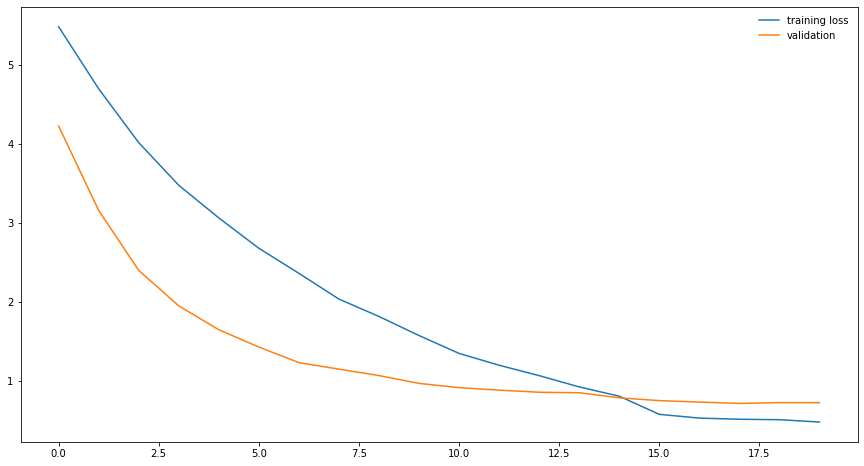

In [28]:
plt.figure(figsize=[15,8])
plt.plot(tn_loss,label="training loss")
plt.plot(val_loss, label="validation")
plt.legend(frameon=False)

plt.show()

In [29]:
model.load_state_dict(torch.load("/content/model_state.pt"))

<All keys matched successfully>

In [30]:
model.fc[1] = nn.Identity()

In [31]:
embedding_layer = model
print(embedding_layer)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [32]:
class ImageBatchSampler(BatchSampler):
    """
    Returns batches of size n_classes * n_samples
    """
    
    def __init__(self, dataset,n_classes, n_samples):
        loader = DataLoader(dataset)
        self.labels_list = []
        for _, label in loader:
            self.labels_list.append(label)
        self.labels = torch.LongTensor(self.labels_list)
        self.labels_set = list(set(self.labels.numpy()))
        self.label_to_indices = {label: np.where(self.labels.numpy() == label)[0]
                                 for label in self.labels_set}
        for l in self.labels_set:
            np.random.shuffle(self.label_to_indices[l])
        self.used_label_indices_count = {label: 0 for label in self.labels_set}
        self.count = 0
        self.n_classes = n_classes
        self.n_samples = n_samples
        self.dataset = dataset
        self.batch_size = self.n_classes * self.n_samples

    def __iter__(self):
        self.count = 0
        while self.count + self.batch_size < len(self.dataset):
            classes = np.random.choice(self.labels_set, self.n_classes, replace=False)
            indices = []

            for class_ in classes:
                indices.extend(self.label_to_indices[class_][
                               self.used_label_indices_count[class_]:self.used_label_indices_count[
                                                                         class_] + self.n_samples])
                self.used_label_indices_count[class_] += self.n_samples
                if self.used_label_indices_count[class_] + self.n_samples > len(self.label_to_indices[class_]):
                    np.random.shuffle(self.label_to_indices[class_])
                    self.used_label_indices_count[class_] = 0
            yield indices
            self.count += self.n_classes * self.n_samples

    def __len__(self):
        return len(self.dataset) // self.batch_size

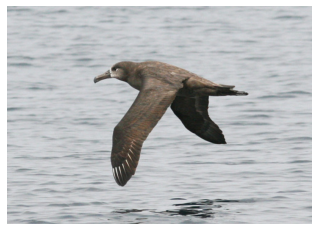

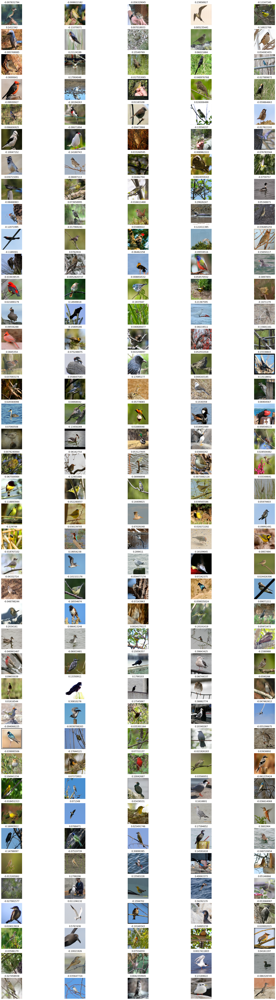

In [33]:
test_sampler = ImageBatchSampler(test_data, 200, 1)
test_loader = DataLoader(test_data, batch_sampler=test_sampler)
my_testiter = iter(test_loader)
images, target = my_testiter.next()

query_image = "/content/test/001.Black_footed_Albatross/Black_Footed_Albatross_0016_796067.jpg"
query_image = Image.open(query_image)
plt.axis("off")
plt.imshow(query_image)
query_image = transform(query_image).to(device)
query_image = query_image.unsqueeze(0)
query_image = embedding_layer(query_image)
cos = nn.CosineSimilarity(dim=1)

plt.figure(figsize=(30,100))
s = 0
for i, image in enumerate(images):
    if i > 199: continue
    feature_image = image.unsqueeze(0).to(device)
    feature_emb = embedding_layer(feature_image)
    distance = cos(feature_emb,query_image)
    distance = distance.cpu().detach().numpy()[0]
    img = image.numpy()
    img = np.moveaxis(img,0,-1)
    plt.subplot(40,5,i+1)
    plt.title(distance)
    plt.axis("off")
    plt.imshow(img)

In [36]:
sample_image = "/content/test/001.Black_footed_Albatross/Black_Footed_Albatross_0056_796078.jpg"
sample_image = Image.open(sample_image)
sample_image = transform(sample_image).to(device)
sample_image = sample_image.unsqueeze(0)
sample_image = embedding_layer(sample_image)
distance = cos(sample_image,query_image)
distance = distance.cpu().detach().numpy()[0]
distance

0.45492628